# <center>*Shout Option*</center>
A shout option is a type of financial derivative where the holder has the right, but not the obligation, to "shout" to the seller and lock in the option's payoff at any time before expiration. This allows the option holder to capture profits if the price of the underlying asset moves in their favor without waiting until expiration. 

Shout options are often used to hedge against sudden price movements in volatile markets, as they allow the holder to lock in profits without having to wait until expiration. However, this feature comes at a cost, as the option holder typically pays a higher premium for the option due to the added flexibility it provides.

The BSM pricing formula for a shout option is similar to that of a standard European option, but with the added flexibility of the shout feature. If the option is not shouted, the payout is calculated as the difference between the strike price and the price of the underlying asset at expiration for a call option, or the difference between the price of the underlying asset at expiration and the strike price for a put option. If the option is shouted, the payout is calculated as the difference between the strike price and the price of the underlying asset at the time of shouting for a call option, or the difference between the price of the underlying asset at the time of shouting and the strike price for a put option.

The BSM pricing formula for a shout call option is:

$$ C = S_t \cdot N(d_1) - K \cdot e^{-r(T-t)} \cdot N(d_2) + e^{-r(T-t)} \cdot (S_{shout} - K) \cdot N(d_3) $$

where:
- $C$: the price of the shout call option
- $S_t$: the current price of the underlying asset
- $K$: the strike price
- $r$: the risk-free interest rate
- $T$: the time to expiration
- $t$: the current time
- $\sigma$: the volatility of the underlying asset's returns
- $S_{shout}$: the price of the underlying asset at the time of shouting
- $d_1 = \frac{\ln(S_t/K) + (r + (\sigma^2)/2) \cdot (T-t)}{\sigma \sqrt{T-t}}$
- $d_2 = d_1 - \sigma \sqrt{T-t}$
- $d_3 = \frac{\ln(S_{shout}/K) + (r + (\sigma^2)/2) \cdot (T-t)}{\sigma \sqrt{T-t}}$

The BSM pricing formula for a shout put option is:

$$ P = K \cdot e^{-r(T-t)} \cdot N(-d_2) - S_t \cdot N(-d_1) + e^{-r(T-t)} \cdot (K - S_{shout}) \cdot N(-d_3) $$

where:
- $P$: the price of the shout put option
- $S_t$: the current price of the underlying asset
- $K$: the strike price
- $r$: the risk-free interest rate
- $T$: the time to expiration
- $t$: the current time
- $\sigma$: the volatility of the underlying asset's returns
- $S_{shout}$: the price of the underlying asset at the time of shouting
- $d_1 = \frac{\ln(S_t/K) + (r + (\sigma^2)/2) \cdot (T-t)}{\sigma \sqrt{T-t}}$

I will now derive this pricing formulae:-
$$ P = e^{-rT}(S_0e^{(b-r-\frac{1}{2}\sigma^2)T}N(d_1')-Ke^{-rT}N(d_1)-SN(d_2')) $$

To derive this formula, we first note that the shout option has a fixed payoff if the underlying asset price is above the shout level, and pays nothing if the underlying asset price is below the strike price. The payoff for a shout option can be represented as follows:

$$ Q = 
\begin{cases}
    S_T-K, & \text{if } S_T \geq S \\
    S-K, & \text{if } K < S_T < S \\
    0, & \text{otherwise}
\end{cases} $$

where $Q$ is the payoff, $S_T$ is the price of the underlying asset at expiry, $K$ is the strike price, and $S$ is the shout level.

The price of a shout option can be calculated using the Black-Scholes model with an adjustment for the shout level.

Using the risk-neutral valuation principle, we can assume that the expected payoff of the option is equal to its present value. Therefore, we can write:

$$ P = e^{-rT}E[Q] $$

To calculate $E[Q]$, we need to derive the distribution of $S_T$. Using the Black-Scholes model with an adjustment for the shout level, we can derive the following expressions for $d_1'$ and $d_2'$:

$$ d_1' = \frac{\ln(S_0/S)+(b+\frac{1}{2}\sigma^2)T}{\sigma\sqrt{T}} $$

and

$$ d_2' = d_1' - \sigma\sqrt{T} $$

Substituting these expressions into the equation for the expected payoff, we get:

$$ P = e^{-rT}E[Q] $$
$$ = e^{-rT}[(S_0-K)N(d_1')e^{-(b-r)T} + (S-K)[N(d_2') - N(d_1)]] $$
$$ = e^{-rT}(S_0e^{(b-r-\frac{1}{2}\sigma^2)T}N(d_1')-Ke^{-rT}N(d_1)-SN(d_2')) $$

which is the formula for pricing a shout option with strike $K$ and shout level $S$. 

Below is the sensitivity analysis of a Gap Option along with all the relevant plots:-


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import norm

In [2]:
def ShoutOptionCall(t, T, sigma, r, St, K, L):
    d1 = (np.log(St/K) + (r + sigma**2/2)*(T-t)) / (sigma*np.sqrt(T-t))
    d2 = d1 - sigma*np.sqrt(T-t)
    vanilla_price = St*norm.cdf(d1) - K*np.exp(-r*(T-t))*norm.cdf(d2)
    if St >= L:
        price = vanilla_price + (St - L)*np.exp(-r*(T-t))*norm.cdf((np.log(St/L) + (r + sigma**2/2)*(T-t))/(sigma*np.sqrt(T-t)))
    else:
        price = vanilla_price
    return price

def ShoutOptionPut(t, T, sigma, r, St, K, L):
    d1 = (np.log(St/K) + (r + sigma**2/2)*(T-t)) / (sigma*np.sqrt(T-t))
    d2 = d1 - sigma*np.sqrt(T-t)
    vanilla_price = K*np.exp(-r*(T-t))*norm.cdf(-d2) - St*norm.cdf(-d1)
    if St <= L:
            price = vanilla_price + (L - St)*np.exp(-r*(T-t))*norm.cdf(-(np.log(St/L) + (r + sigma**2/2)*(T-t))/(sigma*np.sqrt(T-t)))
    else:
        price = vanilla_price
    return price

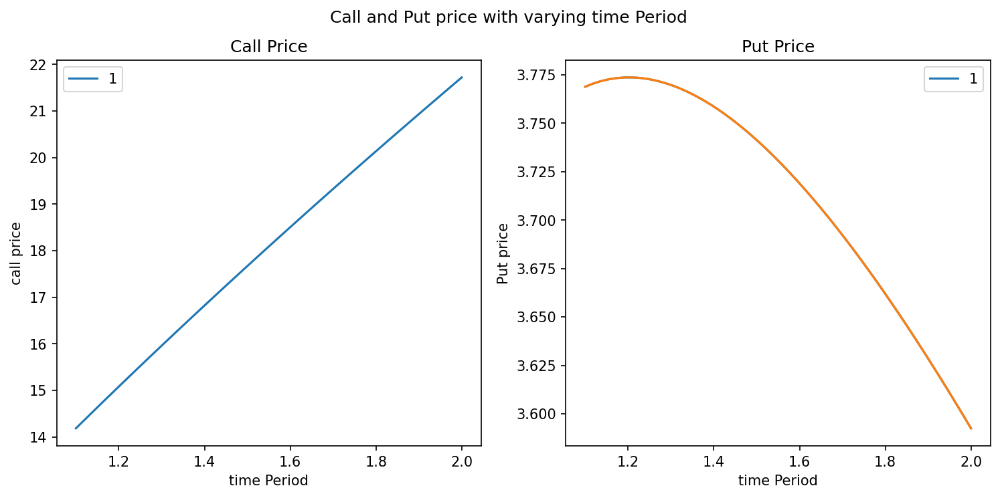

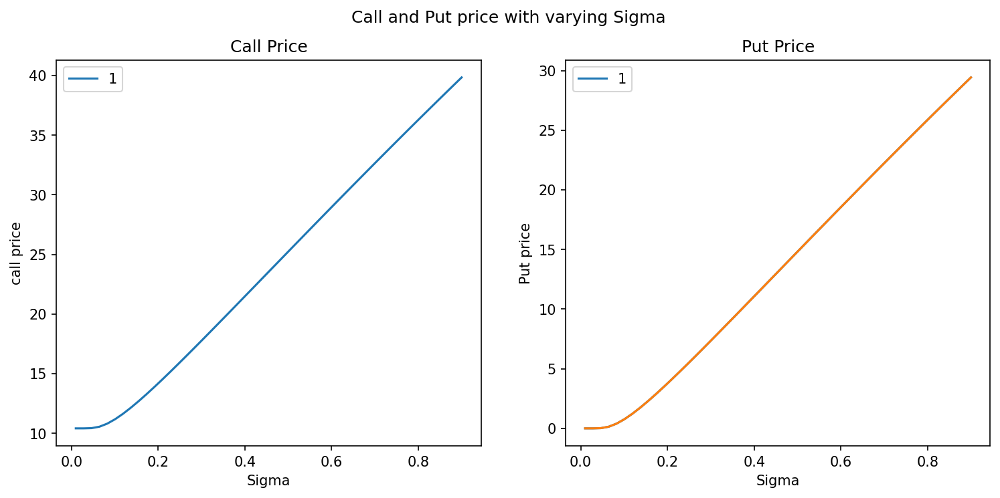

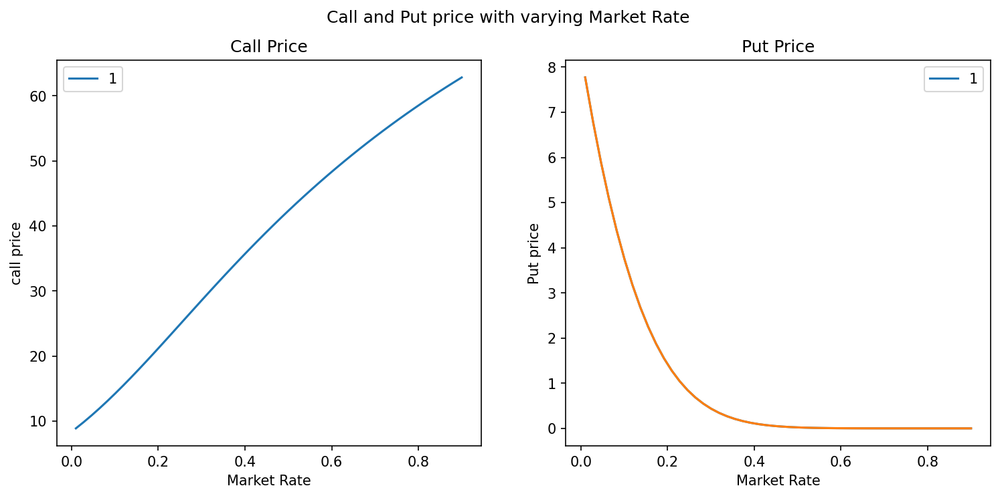

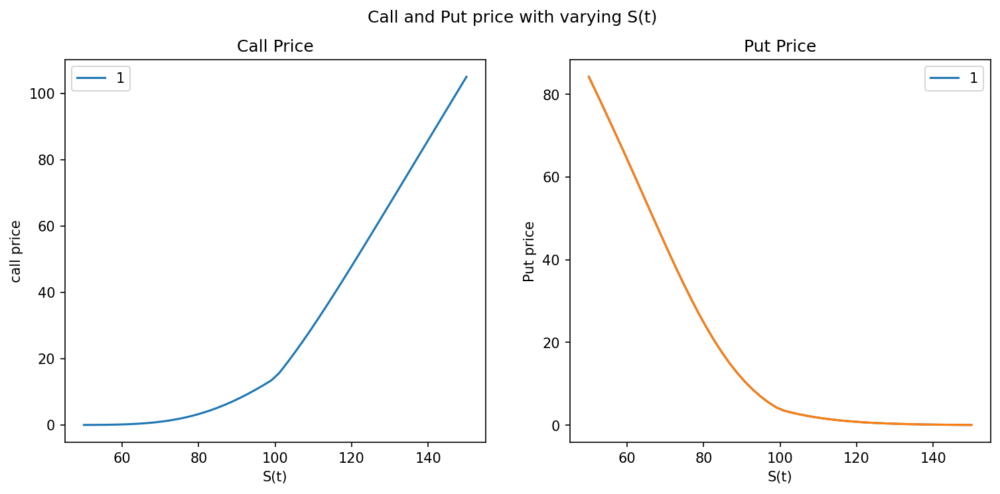

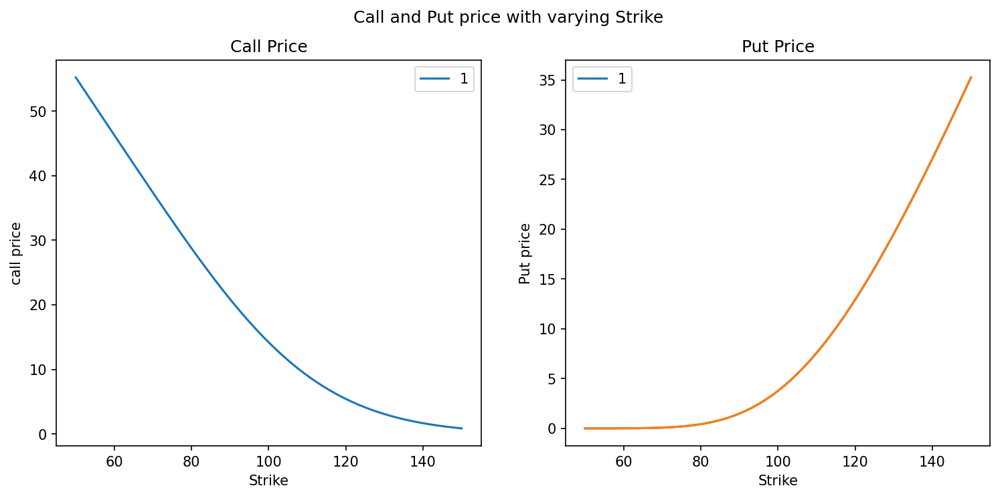

...

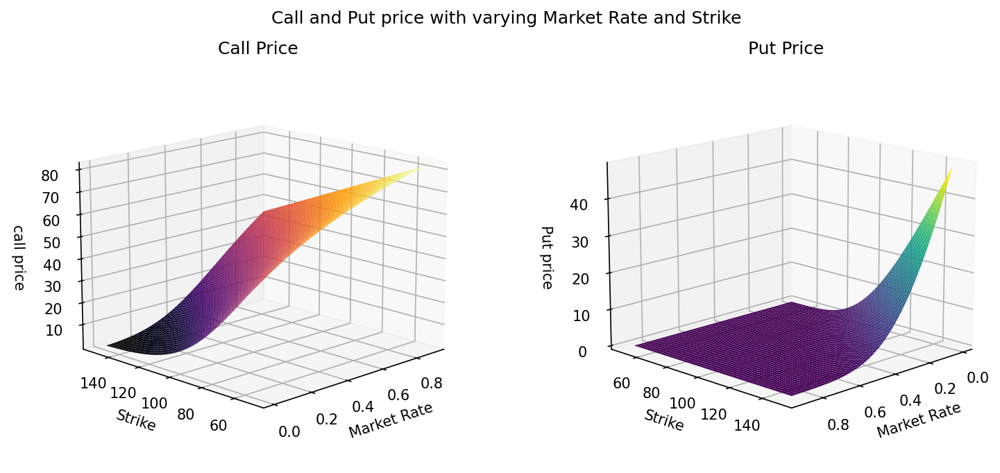

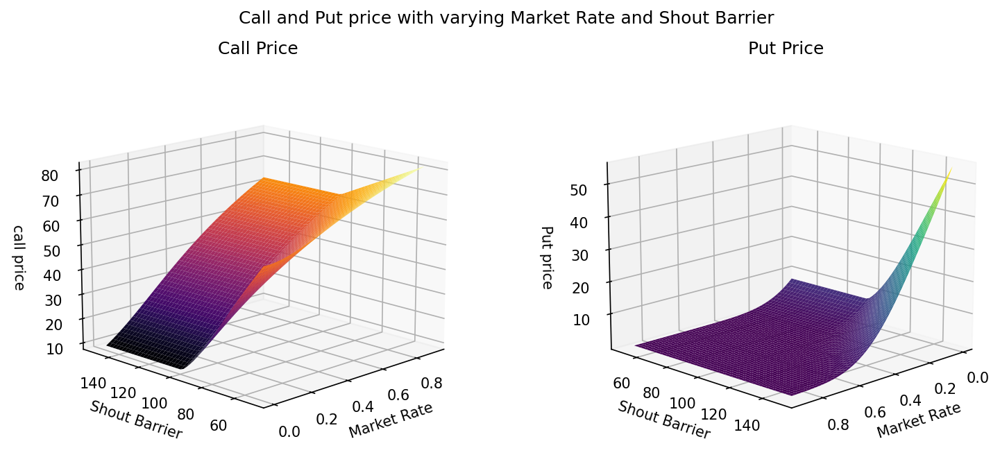

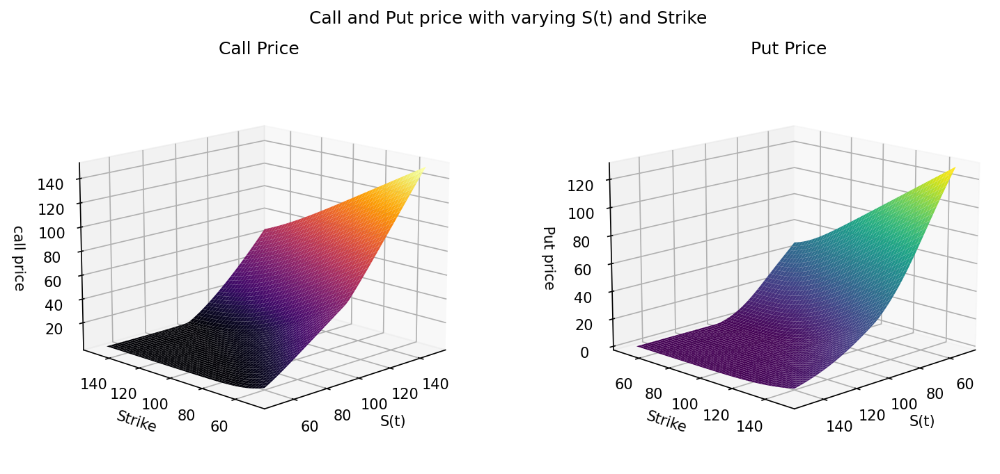

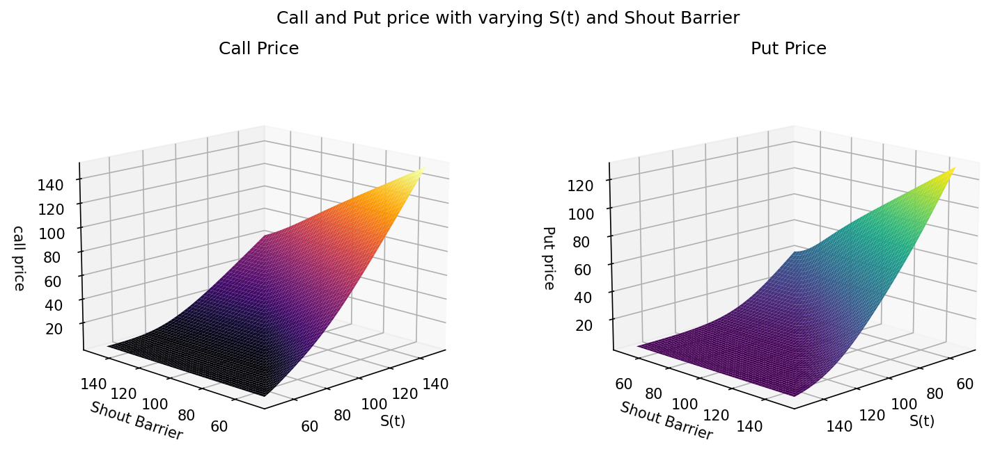

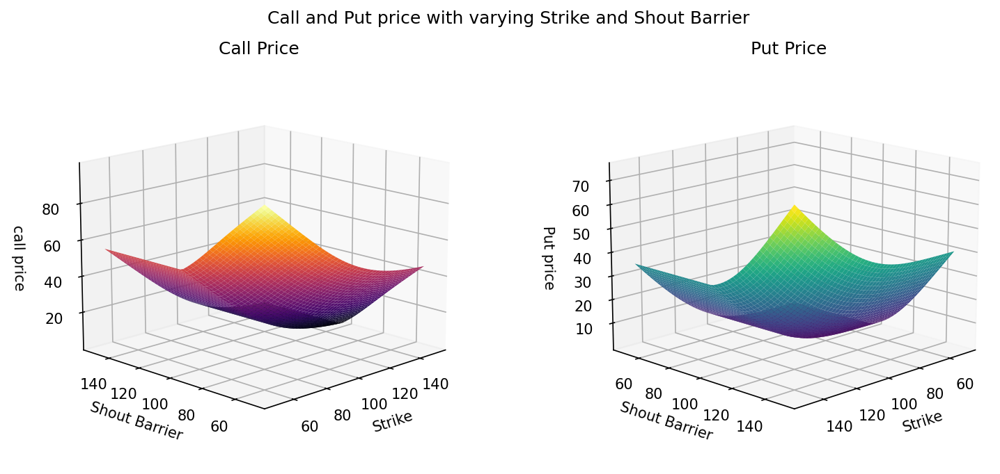

In [3]:
# def optionPrice(t, T, sigma, r, St, K, L):
varying = []
varying.append(np.linspace(0,1,50))
varying.append(np.linspace(1.1,2,50))
varying.append(np.linspace(0.01,0.90,50))
varying.append(np.linspace(0.01,0.90,50))
varying.append(np.linspace(50,150,50))
varying.append(np.linspace(50,150,50))
varying.append(np.linspace(50,150,50))

names = ["start time", "time Period", "Sigma", "Market Rate", "S(t)", "Strike", "Shout Barrier"]
for i in range(1,6):
    fig, ax = plt.subplots(nrows = 1,ncols = 2)
    for st in [1]:
        call_p = []
        put_p = []
        params = [0, 1.1, 0.2, 0.1, 100, 100, 100]
        for ii in range(len(varying[i])):
            params[i]=varying[i][ii]
            call_p.append(ShoutOptionCall(params[0],params[1],params[2],params[3],params[4],params[5],params[6]))
            put_p.append(ShoutOptionPut(params[0],params[1],params[2],params[3],params[4],params[5],params[6]))
            fig.suptitle("Call and Put price with varying "+names[i])
        ax[0].plot(varying[i],call_p)
        ax[1].plot(varying[i],put_p)
    fig.set_size_inches(12, 5)
    fig.set_dpi(150)
    ax[0].set_title("Call Price")
    ax[0].set_xlabel(names[i])
    ax[0].set_ylabel("call price")
    ax[1].plot(varying[i],put_p)
    ax[1].set_title("Put Price")
    ax[1].set_xlabel(names[i])
    ax[1].set_ylabel("Put price")
    ax[0].legend([1])
    ax[1].legend([1])
    plt.show()

for i in range(7):
    for j in range(i+1,7):
        fig, ax = plt.subplots(nrows = 1,ncols = 2,subplot_kw={"projection": "3d"})
        call_p = np.zeros((50,50))
        put_p = np.zeros((50,50))
        p_axis, q_axis = np.meshgrid(varying[i],varying[j])
        params = [0, 1.1, 0.2, 0.1, 100, 100, 100]
        for ii in range(len(p_axis)):
            for jj in range(len(q_axis)):
                params[i]=varying[i][ii]
                params[j]=varying[j][jj]
                call_p[ii][jj]=ShoutOptionCall(params[0],params[1],params[2],params[3],params[4],params[5],params[6])
                put_p[ii][jj]=ShoutOptionPut(params[0],params[1],params[2],params[3],params[4],params[5],params[6])
        call_p=call_p.T
        put_p=put_p.T
        fig.suptitle("Call and Put price with varying "+names[i]+" and "+names[j])
        fig.set_size_inches(12, 5)
        fig.set_dpi(150)
        ax[0].plot_surface(p_axis,q_axis,call_p,cmap='inferno')
        ax[0].set_title("Call Price")
        ax[0].set_xlabel(names[i])
        ax[0].set_ylabel(names[j])
        ax[0].set_zlabel("call price")
        ax[1].plot_surface(p_axis,q_axis,put_p,cmap='viridis')
        ax[1].set_title("Put Price")
        ax[1].set_xlabel(names[i])
        ax[1].set_ylabel(names[j])
        ax[1].set_zlabel("Put price")
        ax[0].view_init(15,-135)
        ax[1].view_init(15,45)
        plt.show()
    